### 1) Importando as bibliotecas e dados

In [304]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.cluster import KMeans 
from yellowbrick.cluster import KElbowVisualizer,InterclusterDistance
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")

In [305]:
mkt = pd.read_csv('Marketing.csv', delimiter = ';')
orders = pd.read_csv('Orders.csv',delimiter = ';')
sessions = pd.read_csv('sessions.csv', delimiter = ';')

In [306]:
mkt.head(5)

,account_id,registration_date,ifood_status,ifood_status_last_month,total_order_count,first_order_date
0,7c0450e7-a806-4208-8449-e4269a27e6b5,2020-02-02,Inactive,Inactive,8,2020-02-28
1,16d0afba-00b8-427a-ba1f-2e397a9fbb54,2016-05-17,Churn,Active,457,2017-03-19
2,61c051ee-d37c-45c6-8c22-c236db3b62b7,2018-09-02,Active,Active,206,2018-09-02
3,82e48692-e4fa-494e-b03e-6815a819b7b1,2017-11-10,Reactivated,Churn,47,2018-05-01
4,382af025-14c8-4ba9-b62f-deddd6f25789,2019-08-05,Inactive,Inactive,66,2019-08-12


In [307]:
orders.head(5)

,order_id,order_shift,order_origin,delivery_fee,scheduled,total_amount,subsidy_amount,device_platform,device_type,device_app_version,centroid_id,state_label,city,district,customer_long,customer_lat,restaurant_id,dish_type,group_id,merchant_centroid_id,merchant_state,merchant_city,merchant_district,merchant_zipcode,merchant_long,merchant_lat,has_free_delivery,confirmed_date,concluded_date,lag_last_order,account_id,review_score,nps_score,review_created_at
0,000f4c94-ec38-488b-ad98-9bf3ea19d517,weekday lunch,RESTAURANT,875.0,False,5375.0,0.00,ANDROID,MOBILE,9.39.1,-22.83-43.35,RJ,RIO DE JANEIRO,Coelho Neto,-43.35,-22.83,83c3e069dbd7267a7565a16b879cd968c0968a27ac16e628868225b97eb41a54,Comida Brasileira,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-22.82-43.38,RJ,RIO DE JANEIRO,PAVUNA,21650420,-43.38,-22.83,False,2020-02-28T14:07:25.953Z,2020-02-28T16:06:03.701Z,1.0,70a2a5a3-8071-47fc-a623-e9995045314e,5.0,8,2020-02-28T19:06:31.861Z
1,0018ed39-3ae0-4047-9c9e-fd9a2027e645,weekend dinner,RESTAURANT,0.0,False,2987.5,1250.00,IOS,MOBILE,9.63.0,-22.93-43.18,RJ,RIO DE JANEIRO,FLAMENGO,-43.18,-22.94,2531d200d387f462ed6e096086723c43b48de9b6c3ec05fb0c752e70c06662b7,Comida Brasileira,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-22.93-43.21,RJ,RIO DE JANEIRO,Rio Comprido,20261170,-43.22,-22.93,True,2020-08-21T21:12:23.295Z,2020-08-21T21:59:18.732Z,1.0,407bab9f-f485-48cd-abea-66e6283058c3,5.0,8,2020-09-04T00:14:14.365Z
2,00214248-5a2d-4333-a919-c1f3afd31389,weekday dinner,RESTAURANT,0.0,False,3737.5,2123.75,IOS,MOBILE,9.56.0,-23.6-46.64,SP,SAO PAULO,Vila Clementino,-46.65,-23.60,e648c3eeabfbbc52d415e4f2b4bb07ed0206c7fff7fb9cdf0c36cca1e98bffb4,Comida Peruana,5384e3b557315ce815e7e3425a4d067f1ecff96978501e0f82078eef8ce09b87,-23.61-46.67,SP,SAO PAULO,INDIANOPOLIS,4029200,-46.67,-23.62,True,2020-07-02T20:21:51.900Z,2020-07-02T20:53:39.176Z,3.0,a16865d2-a3ca-4251-afab-083dadeb06e9,5.0,5,2020-07-03T03:49:03.214Z
3,007199e6-6be4-42d0-986c-a0de7650dc80,weekday dinner,RESTAURANT,862.5,False,2237.5,1.25,DESKTOP,SITE,8.39.0,-22.96-43.39,RJ,RIO DE JANEIRO,Curicica,-43.39,-22.96,c3b2f2bc35b781c126ab4e78db73aa5609e55b1eff34c89f9f9566bbd61545c5,Pizza,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-22.96-43.4,RJ,RIO DE JANEIRO,Curicica,22780193,-43.40,-22.96,False,2020-08-19T20:16:16.718Z,2020-08-19T22:16:16.298Z,0.0,a7f00fd8-d5d6-4604-9bce-ffe35b16848d,5.0,10,2020-08-26T17:44:08.137Z
4,00bb6d10-0a9b-4fe3-9b25-8d18f50bcc3a,weekday lunch,RESTAURANT,0.0,False,2750.0,0.00,DESKTOP,SITE,8.12.0,-23.57-46.64,SP,SAO PAULO,Liberdade,-46.64,-23.57,63271292b131c157593c309acfcbcd5756ec1440879e648ad2bb99f7884bdab4,Comida Brasileira,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-23.59-46.64,SP,SAO PAULO,Vila Mariana,4009002,-46.64,-23.59,True,2020-04-15T13:01:55.231Z,2020-04-15T17:02:37.723Z,1.0,63284037-3ade-4600-88e9-5009b9504d8f,5.0,10,2020-04-17T22:05:13.983Z


In [308]:
sessions.head(5)

,session_id,user_account_uuid,session_started,session_ended,install_timestamp,sum_view_restaurant_screen,sum_view_dish_screen,sum_click_add_item,sum_view_checkout,sum_callback_purchase,first_order_has_voucher,media_campaign,load_time,available_restaurants,rownumber
0,0a364c77-4375-4334-8f64-a06bdd22229c,5a2fbdea-e2ee-41a5-b47c-41fbebdc78ef,2020-02-01T00:00:03.924Z,2020-02-01T00:10:51.217Z,NaN,19,5,6,6,7,False,NaN,5.0,462.0,1
1,b01811cd-ad2c-42f1-bccf-b90698ccc7a8,20cb43a7-c90d-4451-b067-e1b934746de6,2020-02-01T00:00:09.616Z,2020-02-01T00:14:22.713Z,NaN,14,1,0,0,0,NaN,NaN,5.0,128.0,2
2,aa453bd1-da47-4cfa-9ce7-a7e2c9227dec,b6bd9094-c2f0-471c-b6ec-9475d8d0591b,2020-02-01T00:00:14.479Z,2020-02-01T00:08:20.102Z,NaN,31,4,4,3,1,False,NaN,6.0,187.0,3
3,39ca6d98-c9d1-4dff-9158-c7416be6d309,d7ddb2ac-31bf-4e3d-848a-9efc86a70f6d,2020-02-01T00:00:14.650Z,2020-02-01T00:02:49.615Z,NaN,12,3,0,0,0,NaN,NaN,5.0,22.0,4
4,cf456658-0426-46c2-b6c1-fc27c186e15e,8d9bb514-cc57-4181-bb9d-b94b7fbbfd98,2020-02-01T00:00:41.607Z,2020-02-01T00:16:57.415Z,NaN,4,0,0,0,0,NaN,NaN,28.0,3.0,5


### 2) EDA

#### 2.1) Dataset mkt

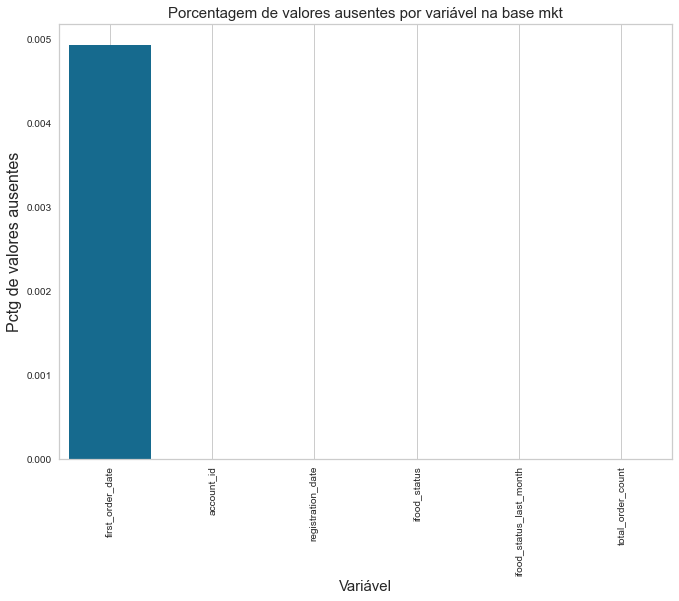

In [309]:
fig, ax = plt.subplots(figsize = (11,8))
mkt_null =(mkt.isnull().sum()/len(mkt))*100
mkt_null.sort_values(ascending=False, inplace=True)
sns.barplot(x = mkt_null.index, y =mkt_null.values)
plt.grid()
plt.title('Porcentagem de valores ausentes por variável na base mkt', fontsize = 15)
plt.xlabel(xlabel='Variável', fontsize = 15)
plt.ylabel(ylabel = 'Pctg de valores ausentes', fontsize = 16)
plt.xticks(rotation = '90')
plt.show();

Praticamente não temos valores missing na base mkt, e os que temos fazem sentido dado que são a data do primeiro pedido e é possível que haja cadastros que não tenham efetuado algum pedido até agora.

A qtd média de pedidos é : 341.3 pedidos
A mediana dos pedidos é : 286.0 pedidos
O desvio padrão dos pedidos é de : 303.2 pedidos


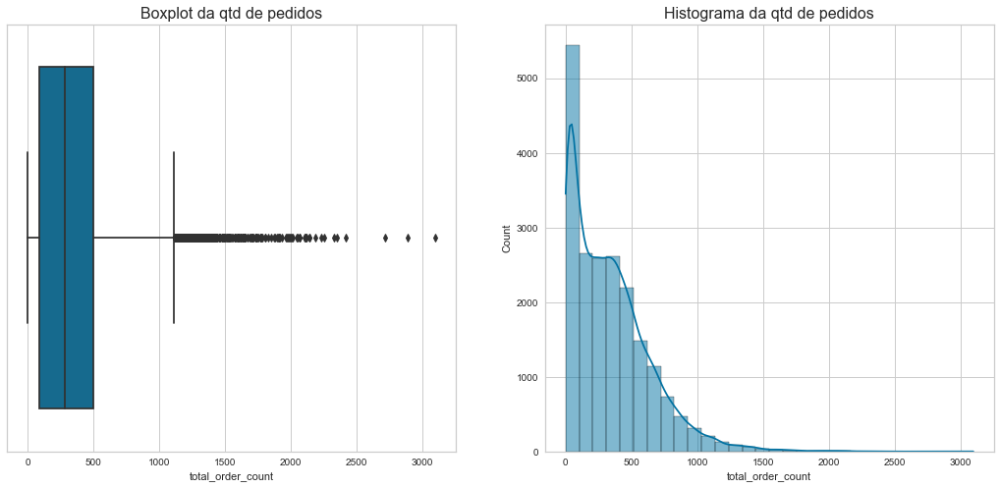

In [310]:
fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot da qtd de pedidos', fontsize = 16)
ax[1].set_title('Histograma da qtd de pedidos', fontsize = 16)
sns.boxplot(ax = ax[0], data=mkt, x = 'total_order_count');
sns.histplot(ax = ax[1], data = mkt, x = 'total_order_count', kde = True, bins = 30);
print(f'A qtd média de pedidos é : {mkt.total_order_count.mean():.1f} pedidos')
print(f'A mediana dos pedidos é : {mkt.total_order_count.median():.1f} pedidos')
print(f'O desvio padrão dos pedidos é de : {mkt.total_order_count.std():.1f} pedidos')

Temos uma mediana até próxima da média e uma cauda comprida para a direita. Como era de se esperar, a maioria dos clientes fez poucos pedidos e poucos clientes fizeram muitos pedidos, chegando até a mais de 3000 pedidos (!!!). Com isso temos um desvio padrão alto também de 303 pedidos. Mas por ser uma variável quantitativa que aborda sobre a frequência de pedidos dos clientes, poderemos usa-la na clusterização. Uma possibilidade seria cruzar ela com o ticket médio por cliente de forma a captar as variáveis quantitativas e econômicas relacionadas aos clientes e tentar uma clusterização.

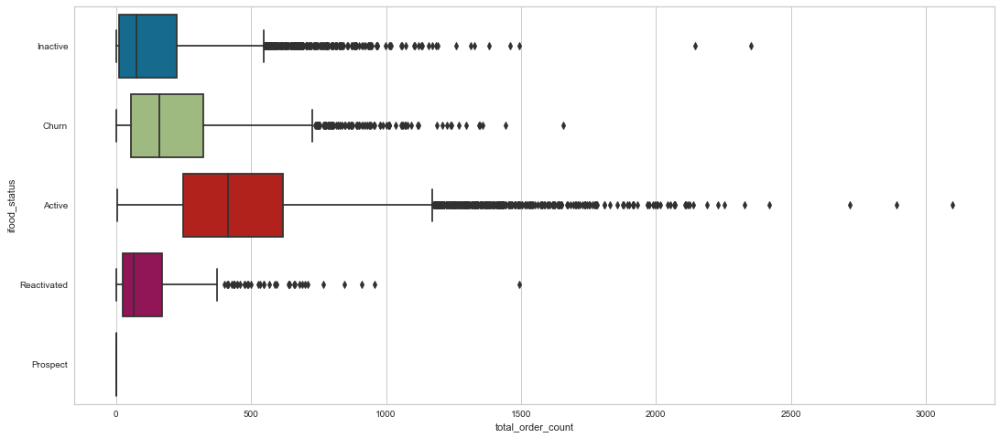

In [311]:
fig, ax = plt.subplots(figsize = (18,8))
sns.boxplot(data=mkt, x = 'total_order_count', y = 'ifood_status');

In [312]:
mkt.first_order_date = mkt.first_order_date.astype('datetime64')

Quando quebramos o boxplot por status vemos que os clientes ativos fazem mais pedidos e tem uma mediana mais alta, o que faz sentido.

In [313]:
mkt['data_final'] = '2020-09-30'
mkt['data_final'] = mkt['data_final'].astype('datetime64')
mkt['first_order_date'] = mkt['first_order_date'].astype('datetime64')
mkt['registration_date'] = mkt['registration_date'].astype('datetime64')

mkt['tempo_primeiro_pedido'] = (mkt['data_final'] - mkt['first_order_date']).dt.days
mkt['tempo_cadastro'] = (mkt['data_final'] - mkt['registration_date']).dt.days
mkt['dif_cadastro_primeiro_pedido'] = (mkt['first_order_date'] - mkt['registration_date']).dt.days
mkt.drop(columns = 'data_final', inplace=True)

Como o último pedido foi feito em 30/9 vamos considerar essa a data final pra calcular os tempos desde o cadastro e a primeira compra.

A qtd média de dias desde o primeiro pedido é : 1160.8 dias
A mediana de dias desde o primeiro pedido é : 1090.0 dias
O desvio padrão de dias desde o primeiro pedido é : 687.3 dias


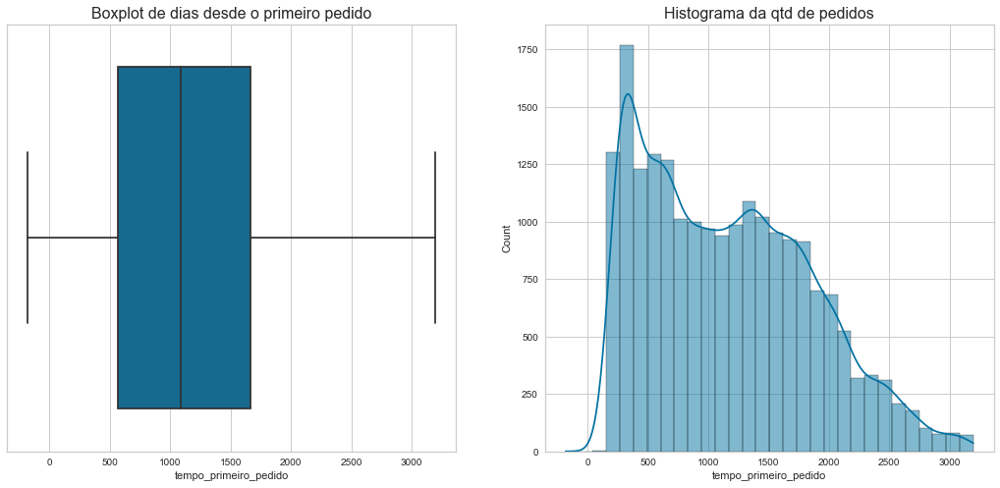

In [314]:
fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot de dias desde o primeiro pedido', fontsize = 16)
ax[1].set_title('Histograma da qtd de pedidos', fontsize = 16)
sns.boxplot(ax = ax[0], data=mkt, x = 'tempo_primeiro_pedido');
sns.histplot(ax = ax[1], data = mkt, x = 'tempo_primeiro_pedido', kde = True, bins = 30);
print(f'A qtd média de dias desde o primeiro pedido é : {mkt.tempo_primeiro_pedido.mean():.1f} dias')
print(f'A mediana de dias desde o primeiro pedido é : {mkt.tempo_primeiro_pedido.median():.1f} dias')
print(f'O desvio padrão de dias desde o primeiro pedido é : {mkt.tempo_primeiro_pedido.std():.1f} dias')

Temos uma distribuição próxima da normal com uma leve cauda pra direita.

A qtd média de dias desde o cadastro é : 1316.7 dias
A mediana de dias desde o cadastro é : 1239.0 dias
O desvio padrão de dias desde o cadastro é : 778.8 dias


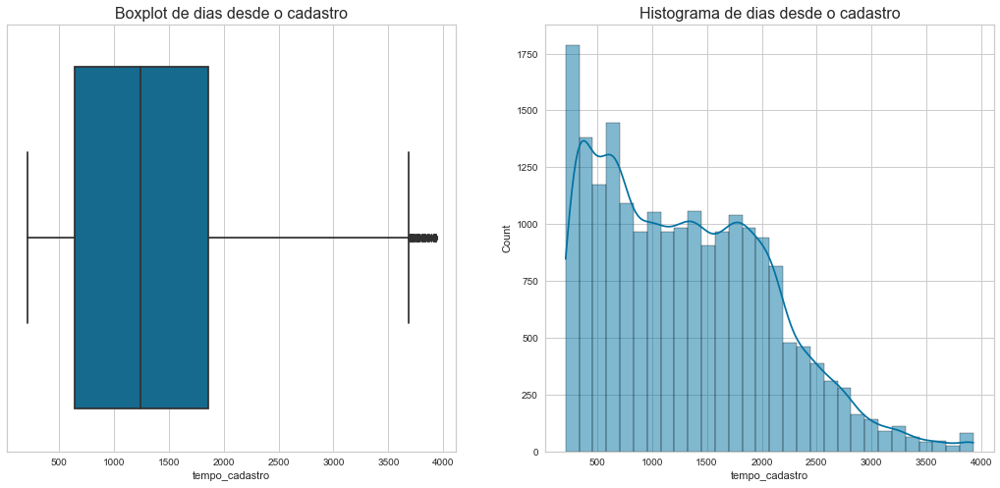

In [315]:
fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot de dias desde o cadastro', fontsize = 16)
ax[1].set_title('Histograma de dias desde o cadastro', fontsize = 16)
sns.boxplot(ax = ax[0], data=mkt, x = 'tempo_cadastro');
sns.histplot(ax = ax[1], data = mkt, x = 'tempo_cadastro', kde = True, bins = 30);
print(f'A qtd média de dias desde o cadastro é : {mkt.tempo_cadastro.mean():.1f} dias')
print(f'A mediana de dias desde o cadastro é : {mkt.tempo_cadastro.median():.1f} dias')
print(f'O desvio padrão de dias desde o cadastro é : {mkt.tempo_cadastro.std():.1f} dias')

Aqui temos uma distribuição próxima da do tempo de pedido, porém com os picos mais altos.

A qtd média de dias de diferença entre cadastro e primeiro pedido é : 155.9 dias
A mediana de dias de diferença entre cadastro e primeiro pedido é : 0.0 dias
O desvio padrão de dias de diferença entre cadastro e primeiro pedido é : 396.3 dias


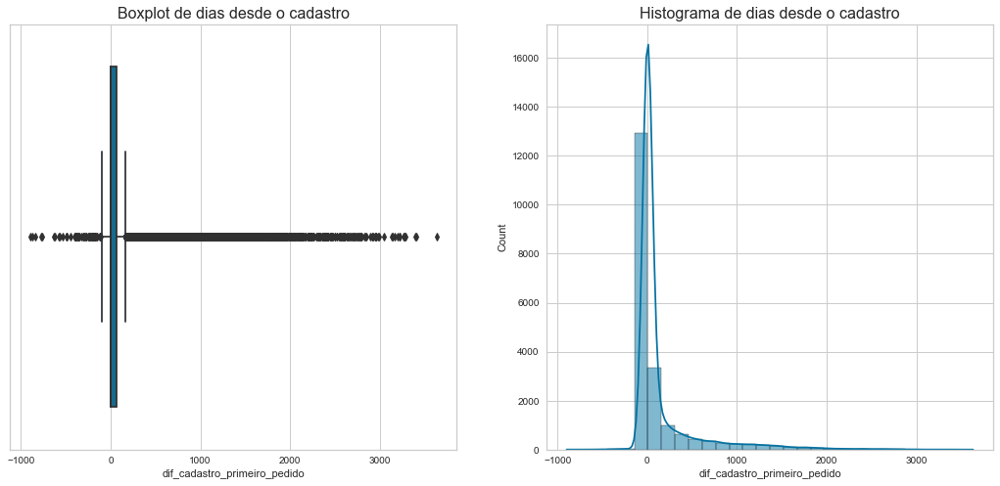

In [316]:
fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot de dias desde o cadastro', fontsize = 16)
ax[1].set_title('Histograma de dias desde o cadastro', fontsize = 16)
sns.boxplot(ax = ax[0], data=mkt, x = 'dif_cadastro_primeiro_pedido');
sns.histplot(ax = ax[1], data = mkt, x = 'dif_cadastro_primeiro_pedido', kde = True, bins = 30);
print(f'A qtd média de dias de diferença entre cadastro e primeiro pedido é : {mkt.dif_cadastro_primeiro_pedido.mean():.1f} dias')
print(f'A mediana de dias de diferença entre cadastro e primeiro pedido é : {mkt.dif_cadastro_primeiro_pedido.median():.1f} dias')
print(f'O desvio padrão de dias de diferença entre cadastro e primeiro pedido é : {mkt.dif_cadastro_primeiro_pedido.std():.1f} dias')

E por fim, vemos que a mediana é 0 na diferença entre o cadastro e o primeiro pedido. Isso faz sentido, dado que a grande maioria das pessoas faz o pedido assim que se cadastra no aplicativo. Temos uma leve cauda pra direita já que uma pequena parcela de pessoas espera um longo período de tempo (até 3000 dias) pra fazer o primeiro pedido após ter se cadastrado. Também temos dados com essa diferença negativa, uma hipótese é clientes que fizeram pedidos sem ter se cadastrado (como visitante por exemplo) e posteriormente fizeram o cadastro.

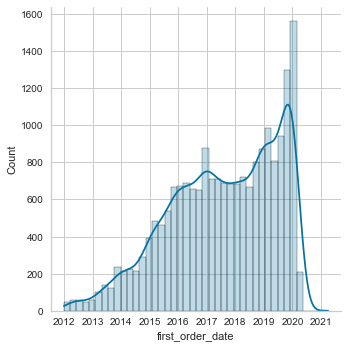

In [317]:
sns.displot(data = mkt, x = 'first_order_date', kde = True, alpha = 0.25);

Outro ponto interessante de se observar é o pico que temos no começo de 2020, quando ocorreu o início da pandemia. Muita gente fez o seu primeiro pedido, provavelmente por conta dos lockdowns por todo o Brasil. Em seguida, no segundo semestre de 2020 aparentemente o número de primeiros pedidos se reduziu muito. Uma hipótese para isso é que o pico da pandemia "adiantou" muitos desses primeiros pedidos e os leads de clientes novos se reduziram desde então. Outra possibilidade na clusterização é analisarmos o comportamente dos clientes de acordo com o tempo desde o seu primeiro pedido para verificar se há padrões diferentes entre os clientes novos, que chegaram na pandemia, e antigos que já estavam antes.

<AxesSubplot:xlabel='ifood_status', ylabel='count'>

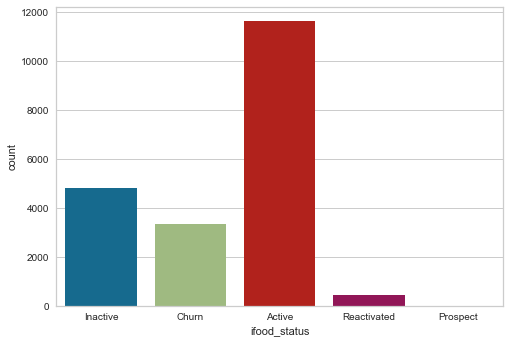

In [318]:
sns.countplot(data = mkt, x = 'ifood_status')

#### 2.2) Dataset orders

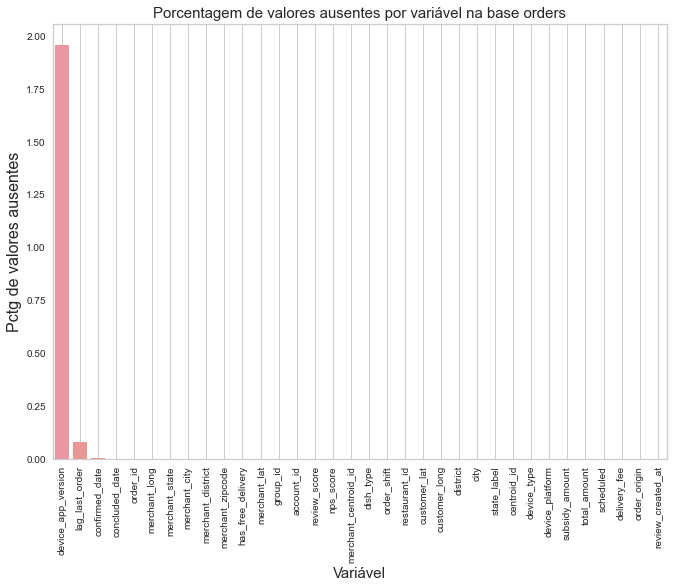

In [319]:
fig, ax = plt.subplots(figsize = (11,8))
orders_null =(orders.isnull().sum()/len(orders))*100
orders_null.sort_values(ascending=False, inplace=True)
sns.barplot(x = orders_null.index, y =orders_null.values)
plt.grid()
plt.title('Porcentagem de valores ausentes por variável na base orders', fontsize = 15)
plt.xlabel(xlabel='Variável', fontsize = 15)
plt.ylabel(ylabel = 'Pctg de valores ausentes', fontsize = 16)
plt.xticks(rotation = '90')
plt.show();

Temos alguns poucos valores nulos e em menos de 2% do dataset e apenas na coluna da versão do app, então não vamos nos preocupar com esses valores missing.

In [320]:
orders[(orders.total_amount.astype(str).str.len()>10)]

,order_id,order_shift,order_origin,delivery_fee,scheduled,total_amount,subsidy_amount,device_platform,device_type,device_app_version,centroid_id,state_label,city,district,customer_long,customer_lat,restaurant_id,dish_type,group_id,merchant_centroid_id,merchant_state,merchant_city,merchant_district,merchant_zipcode,merchant_long,merchant_lat,has_free_delivery,confirmed_date,concluded_date,lag_last_order,account_id,review_score,nps_score,review_created_at
42,0aab6db4-c6d5-443f-bbbb-ed3fc5d9c336,weekend lunch,RESTAURANT,748.75,False,4061.25,0.00,ANDROID,MOBILE,9.62.2,-22.9-43.27,RJ,RIO DE JANEIRO,Meier,-43.28,-22.90,5514fd2aa89b53cfa533b797b94c19afaaea06c644d8dafc519fb7ea705376d9,Lanches,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-22.9-43.28,RJ,RIO DE JANEIRO,MEIER,20720012,-43.29,-22.91,False,2020-08-15T13:46:31.119Z,2020-08-15T14:06:52.914Z,0.0,04c54072-edef-4d06-b73d-4e94f24084a8,5.0,10,2020-08-16T15:58:26.931Z
140,20382609-d383-4380-8387-46934118df07,weekday lunch,STORE,748.75,True,8185.00,0.00,IOS,MOBILE,9.69.0,-25.45-49.29,PR,CURITIBA,VILA IZABEL,-49.30,-25.46,0721a9ccbb430d6e85335d99e0499ad45183cf36a75eb735dc85909e82d86d40,Mercado,f11e29bbcd1e91411d6424b2258586467cd93db103cb86060a623dcad14fe3ad,-25.47-49.3,PR,CURITIBA,Portão,8032030,-49.30,-25.48,False,2020-09-29T13:21:04.792Z,2020-09-29T15:12:17.209Z,0.0,ceadf68c-8272-434f-b6e5-b0dea62a848b,5.0,10,2020-10-03T15:00:22.387Z
162,24c606b8-4334-4c38-a2d8-babac3a2e2fd,weekday dinner,RESTAURANT,0.00,False,16087.50,612.50,ANDROID,MOBILE,9.46.1,-22.87-43.33,RJ,RIO DE JANEIRO,ENGENHEIRO LEAL,-43.33,-22.88,e9b8f6aaf19f7526866d135c25ead85bfc0d8447fbdb9166a0a3c7a790bd3475,Comida Japonesa,3f84984366db635ba5763d7e4cb998df6d5f96ed83e64ad16af87a465846cf6d,-22.9-43.34,RJ,RIO DE JANEIRO,PRACA SECA,21320040,-43.35,-22.90,True,2020-04-13T20:40:16.121Z,2020-04-13T21:38:56.491Z,11.0,2aefed65-a4b9-4311-8034-4a7177e89b5b,5.0,10,2020-04-14T00:39:12.012Z
760,af3536b9-3c21-4c0c-92c1-086a16379529,weekday dinner,RESTAURANT,748.75,False,4061.25,625.00,IOS,MOBILE,9.56.0,-25.42-49.26,PR,CURITIBA,CENTRO CIVICO,-49.27,-25.42,8246bb3b656892ebeafb00cc6cf179a95e1be769888ffc99b59b99f666ee0c0c,Lanches,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-25.44-49.28,PR,CURITIBA,Centro,80010030,-49.28,-25.44,False,2020-07-06T18:26:02.525Z,2020-07-06T18:59:53.066Z,0.0,e69749eb-78a5-4f59-bf2b-6ea19220dbc4,5.0,9,2020-07-07T04:58:17.060Z
810,b85c1214-fd6a-4da0-9406-cfed1a762fbe,weekday snack,RESTAURANT,1237.50,False,8112.50,1000.00,ANDROID,MOBILE,9.41.3,-22.92-43.23,RJ,RIO DE JANEIRO,Tijuca,-43.24,-22.93,d4a7b4bedecf14fbf35cf6cdf5120cfd66f7cb0ccf070c158b9693790248ae4c,Sorvetes,b964b5461eb695f673b7c373dc00b5b7863eb2be7afd22ddbed304b57d47eaaf,-22.92-43.24,RJ,RIO DE JANEIRO,Tijuca,20511000,-43.24,-22.93,False,2020-03-10T15:23:50.790Z,2020-03-10T19:23:50.214Z,0.0,ab3b5ef4-1338-4e09-a84b-641173a346ff,5.0,10,2020-03-16T00:18:01.946Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225722,7f83ed5f-f860-4004-b61b-54e4536c2fb7,weekend dinner,RESTAURANT,0.00,False,8175.00,0.00,ANDROID,MOBILE,9.43.2,-23.57-46.55,SP,SAO PAULO,Vila Formosa,-46.55,-23.57,cc945e5fac74295ec3389ffe01b746ece55f143164caddece20a2ae6f1188e0a,Lanches,a5f4f23b010ccfb5db1f4ee4354ce39d0a932694b058c10b507f7100fd083f42,-23.58-46.59,SP,SAO PAULO,VILA PRUDENTE,3127001,-46.59,-23.59,True,2020-03-27T19:51:47.122Z,2020-03-27T21:14:40.506Z,3.0,88b971d5-023a-4f28-b140-306ccceedb41,4.0,10,2020-03-28T00:47:03.102Z
226068,d14ff404-ac7f-45b0-aca2-c0748f3ceccb,weekend lunch,RESTAURANT,0.00,False,8122.50,0.00,IOS,MOBILE,9.49.0,-22.91-43.29,RJ,RIO DE JANEIRO,MEIER,-43.29,-22.92,f144f2b3f91b0dcd6bc96ac25284cb02fd7b4e9f5eefa02841ad20bf5e2fb296,Comida Brasileira,ae3c8b8d99a39542f78af83dbbb42c81cd94199ec1b5f60a0801063e95842570,-22.91-43.26,RJ,RIO DE JANEIRO,Engenho novo,20715100,-43.27,-22.92,True,2020-05-03T12:06:41.687Z,2020-05-03T16:06:41.241Z,1.0,d2c

Temos alguns pedidos com erro no valor, onde aparece um número que não sabemos nenhum racional lógico que faça sentido para construir um valor em cima. Portanto, como são 1634 erros em um universo de mais de 225 mil pedidos, podemos tranquilamente excluir esses pouco mais de mil pedidos sem influenciar com algum impacto a nossa amostra.

In [321]:
orders = orders[(orders.total_amount.astype(str).str.len()<10)]

In [322]:
orders.total_amount= orders.total_amount.astype('float64');

A qtd média do valor total do pedido é : 5996.5 reais
A mediana de valor total do pedido é : 4498.8 reais
O desvio padrão do valor total do pedido é : 5177.1 reais


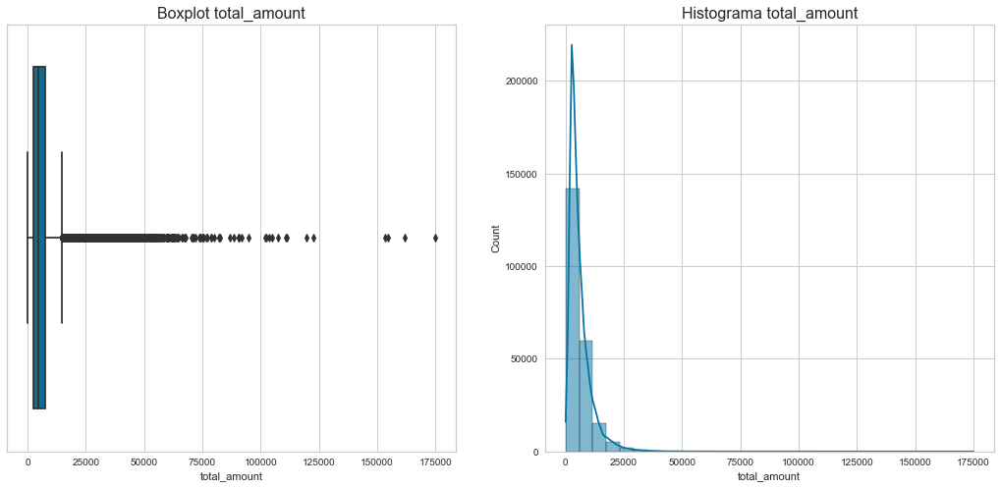

In [323]:
fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot total_amount', fontsize = 16)
ax[1].set_title('Histograma total_amount', fontsize = 16)
sns.boxplot(ax = ax[0], data=orders, x = 'total_amount');
sns.histplot(ax = ax[1], data = orders, x = 'total_amount', kde = True, bins = 30);
print(f'A qtd média do valor total do pedido é : {orders.total_amount.mean():.1f} reais')
print(f'A mediana de valor total do pedido é : {orders.total_amount.median():.1f} reais')
print(f'O desvio padrão do valor total do pedido é : {orders.total_amount.std():.1f} reais')

Como temos muitos outliers, vamos investigar somente no intervalo interquartil da variável.

In [324]:
iqr = orders.total_amount.quantile(0.75) - orders.total_amount.quantile(0.25)
lsup = (orders.total_amount.mean() + 1.5 * iqr)
linf = (orders.total_amount.mean() - 1.5 * iqr)
linf, lsup

(-1109.7762235507098, 13102.72377644929)

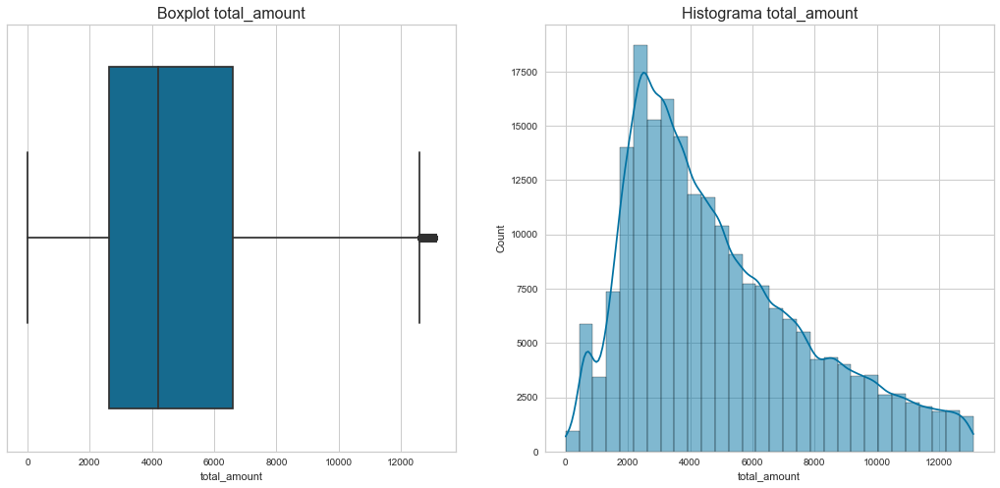

In [325]:
index = (orders.total_amount >= linf) & (orders.total_amount <= lsup)
desc = orders[index]

fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot total_amount', fontsize = 16)
ax[1].set_title('Histograma total_amount', fontsize = 16)
sns.boxplot(ax = ax[0], data=desc, x = 'total_amount');
sns.histplot(ax = ax[1], data = desc, x = 'total_amount', kde = True, bins = 30);

Temos portanto uma distribuição que se assemelha a normal com uma longa cauda para a direita, o que faz sentido dado que os pedidos com alto valor são a minoria e os pedidos mais baratos são a maioria.

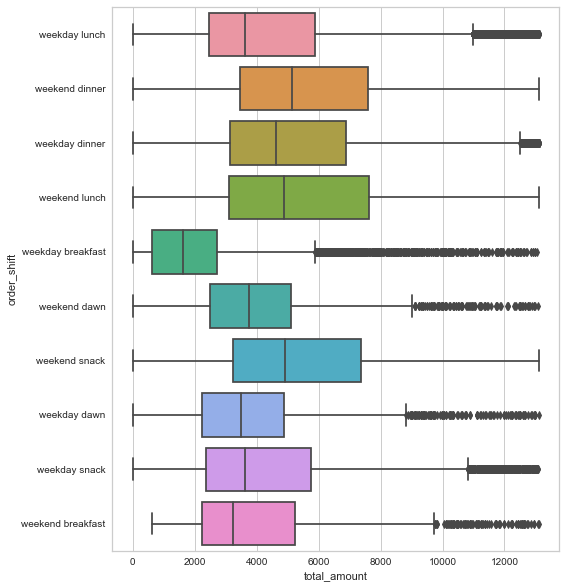

In [326]:
plt.subplots(figsize = (8,10))
sns.boxplot(data = desc, x = 'total_amount', y = 'order_shift');

A partir da quebra do total_amount por order_shift podemos ter alguns insights interessantes. Entre eles:
- A mediana to total_amount dos pedidos de finais de semana é superior. O jantar de finais de semana é a maior mediana, o que faz sentido já que geralmente é um momento que as famílias se reúnem (e muitas vezes evitam cozinhar) e fazem pedidos maiores.
- Durante a semana há uma diferença considerável na mediana do almoço para o jantar (almoço muito mais barato), já no final de semana, apesar de ambas refeições terem um valor mais alto, há uma diferença muito menos entre uma e outra.
- A menor mediana, tanto pra fim de semana quando pra dia de semana, é no café da manhã.
- O lanche da tarde dos finais de semana ('snack') apresenta uma mediana altíssima, praticamente igual a do almoço e muito próxima do jantar. Uma das hipóteses é que nos finais de semana as pessoas deixam para almoçar mais tarde, inclusive fazendo as vezes só uma refeição entre almoço e janta. Já nos dias de semana é muito mais provável que as pessoas peçam realmente lanches como um açaí, ou uma tapioca, do que um almoço de fato (que tem o total_amount maior).

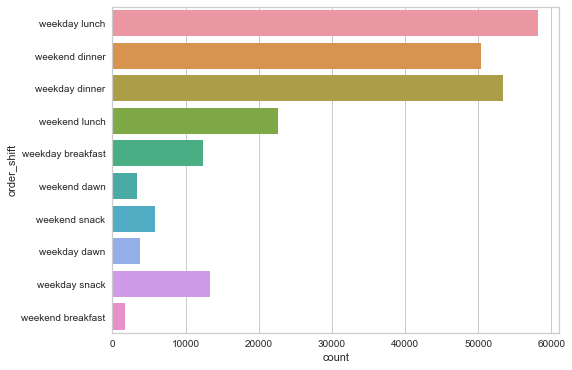

In [327]:
plt.subplots(figsize = (8,6))
sns.countplot(data = orders, y = 'order_shift');

Apesar do menor ticket mpedio o almoço durante a semana é a refeição mais popular, seguido pelo jantar em dia de semana e jantar finais de semana(maior ticket médio). Também observamos que há uma diferença muito grande entre os três primeiros períodos e o quarto, que é o almoço nos finais de semana -> Mais do que o dobro do 4º pro 3º. Já o período menos popular são os cafés da manhã dos finais de semana, o que faz sentido também dado que nos finais de semana as pessoas geralmente acordam mais tarde e tem tempo pra organizar seu próprio café da manhã.

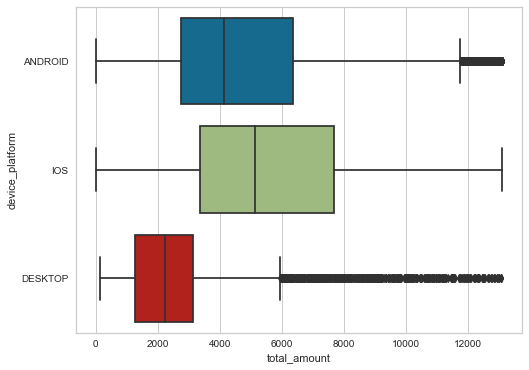

In [328]:
plt.subplots(figsize = (8,6))
sns.boxplot(data = desc, x = 'total_amount', y = 'device_platform');

Há uma diferença considerável no total_amount de acordo com a plataforma em que o pedido foi feito. O desktop é disparado o menor com uma mediana próxima a 2000, android com pouco mais de 4000 e IOS já superando os 5000. Inclusive também, o 75p de IOS chega a quase 8000 de total_amount. Portanto, claramente os usuários de IOS tem o maior poder aquistivo.

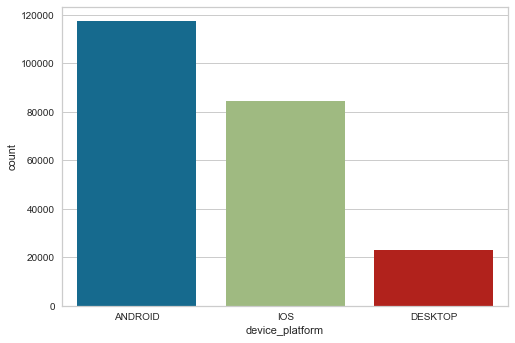

In [329]:
sns.countplot(data = orders, x = 'device_platform');

Porém, android é a plataforma mais popular por quase 30% a mais que IOS.

In [330]:
orders.has_free_delivery.describe()

count     224817
unique         2
top         True
freq      119268
Name: has_free_delivery, dtype: object

Um pouco mais da metade dos pedidos teve entrega grátis.

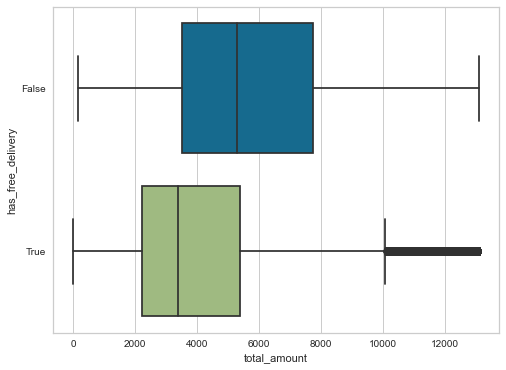

In [331]:
plt.subplots(figsize = (8,6))
desc.has_free_delivery = desc.has_free_delivery.astype('category')
sns.boxplot(data = desc, x = 'total_amount', y = 'has_free_delivery');

Há uma diferença considerável na mediana do total_amount dos pedidos que tem entrega grátis e dos que não. Os que tem entrega grátis são bem mais baratos do que os com entrega paga.

<AxesSubplot:>

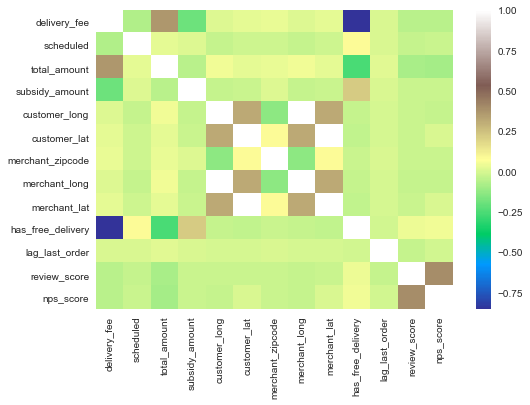

In [332]:
corr = orders.corr()
sns.heatmap(corr,cmap = 'terrain')

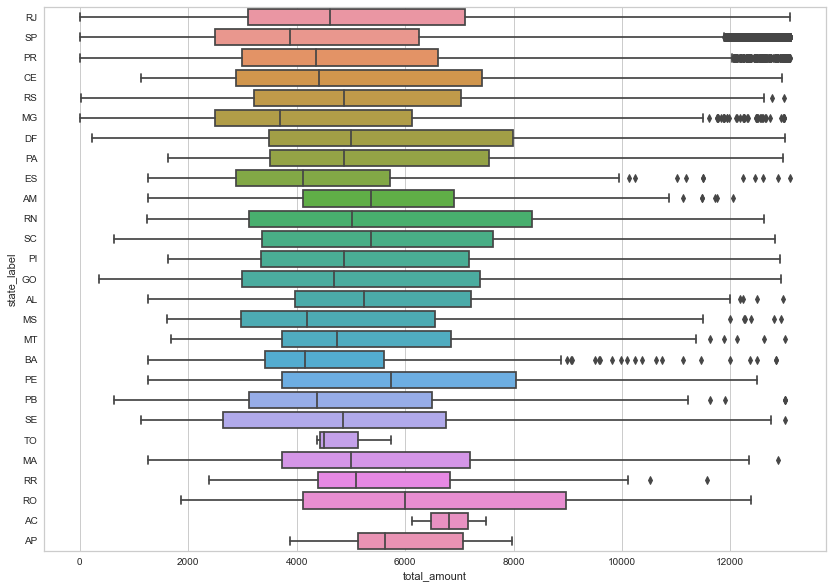

In [333]:
plt.subplots(figsize = (14,10))
sns.boxplot(data = desc, x = 'total_amount', y = 'state_label');

- SP e MG que são dois dos estados mais ricos do país são os que tem as menores medianas do total_amount. Uma hipótese pra isso é a quantidade de cidades pequenas (que geralmente tem nesses pedidos com valor menor) nesses dois estados, e portanto puxam o valor pra baixo. Em SP e MG também como podemos ver há muitos outliers com total_amount altos, o que significa que há restaurantes caros e as pessoas pedem nesses locais (também vemos a faixa de amount estendida em RJ, PR, CE e DF)
- Muitos poucos pedidos em alguns estados como TO, AC e AP
- Os maiores range da distribuição estão em RJ, SP e DF. O que faz sentido, em lugares populosos há grande variação de opções na plataforma do ifood e portanto o total_amount varia em um range maior. Nas cidades pequenas inclusive, pequenos negócios as vezes tendem a preferir desenvolver um próprio esquema de pedidos ao ifood, por conta das taxas e tradições de cidades pequenas, o que faz com que somente os restaurantes mais consolidados tendam a entrar no ifood nessas cidades menores.

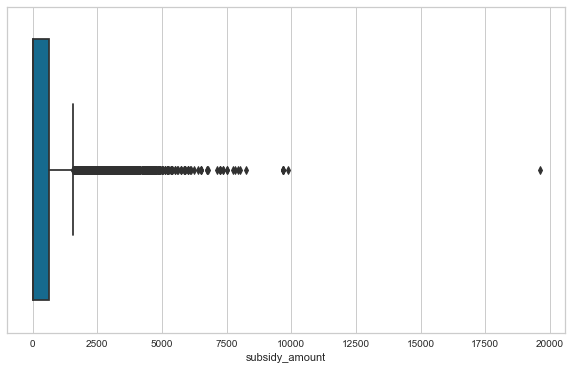

In [334]:
plt.subplots(figsize = (10,6))
sns.boxplot(data = orders, x = 'subsidy_amount');

In [335]:
orders.subsidy_amount.describe()

count    224817.000000
mean        344.041876
std         678.088013
min          -2.500000
25%           0.000000
50%           0.000000
75%         623.750000
max       19611.250000
Name: subsidy_amount, dtype: float64

Vemos que a mediana é 0, indicando que mais da metade dos pedidos não teve nenhum desconto. Já o 75p chega a 623 de desconto, e há a presença de muitos outliers. Por isso, vamos investigar melhor a relação do desconto o total do pedido.

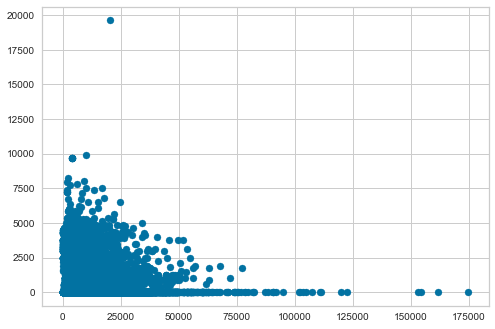

In [336]:
plt.scatter(data = orders, x = 'total_amount', y ='subsidy_amount');

A visualização ficou difícil por causa dos outliers, por isso vamos focar somente no intervalo interquartil do total_amount

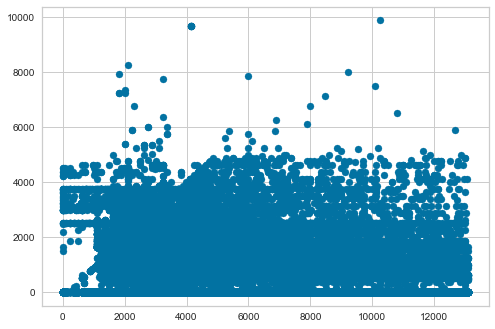

In [337]:
plt.scatter(data = desc, x = 'total_amount', y ='subsidy_amount');

Vemos que independente do valor de total_amount parece haver um limite no desconto, próximo dos 4000. Isso faz sentido dado que não vemos cupons de desconto com valores altíssimos, geralmente é no máximo 20 reais. Há alguns poucos descontos superior, e faz sentido quando eles são até iguais ao total_amount (mas nunca quando são superiores, já que o desconto não pode ser maior que o total do pedido). Há alguns casos em que o desconto é maior do que o valor do pedido, ai nesse caso devem ser erros.

In [338]:
orders['val_pedido'] = orders['total_amount'] - orders['subsidy_amount']

In [339]:
iqr = orders.val_pedido.quantile(0.75) - orders.val_pedido.quantile(0.25)
lsup = (orders.val_pedido.mean() + 1.5 * iqr)
linf = (orders.val_pedido.mean() - 1.5 * iqr)
linf, lsup

(-1540.0680998323078, 12844.931900167692)

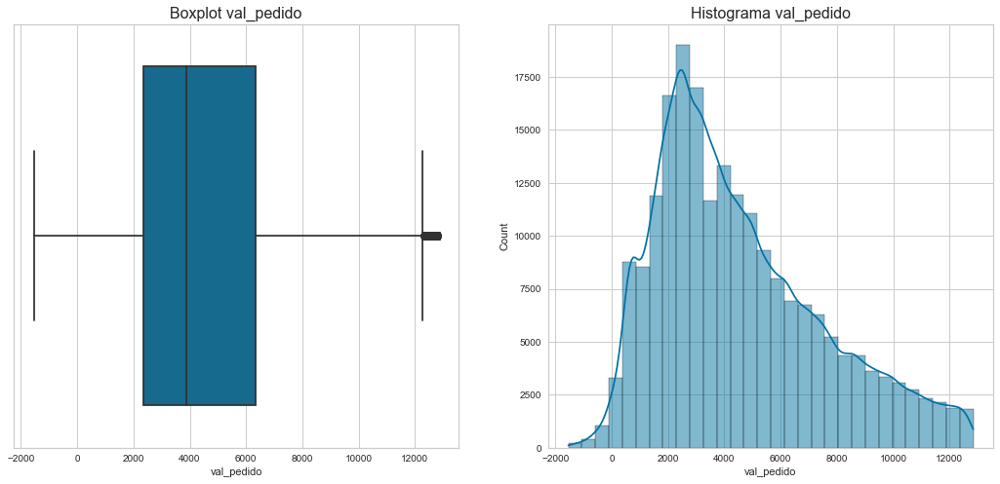

In [340]:
index = (orders.val_pedido >= linf) & (orders.val_pedido <= lsup)
desc = orders[index]

fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot val_pedido', fontsize = 16)
ax[1].set_title('Histograma val_pedido', fontsize = 16)
sns.boxplot(ax = ax[0], data=desc, x = 'val_pedido');
sns.histplot(ax = ax[1], data = desc, x = 'val_pedido', kde = True, bins = 30);

Nossa mediana basicamente só foi puxada um pouco pra esquerda, por conta dos descontos. De resto a distribuição é praticamente a mesma do que total_amount.

In [341]:
orders.confirmed_date = orders.confirmed_date.astype('datetime64')
orders.concluded_date = orders.concluded_date.astype('datetime64')

In [342]:
orders['timespan'] = (orders['concluded_date'] - orders['confirmed_date']).dt.seconds / 60

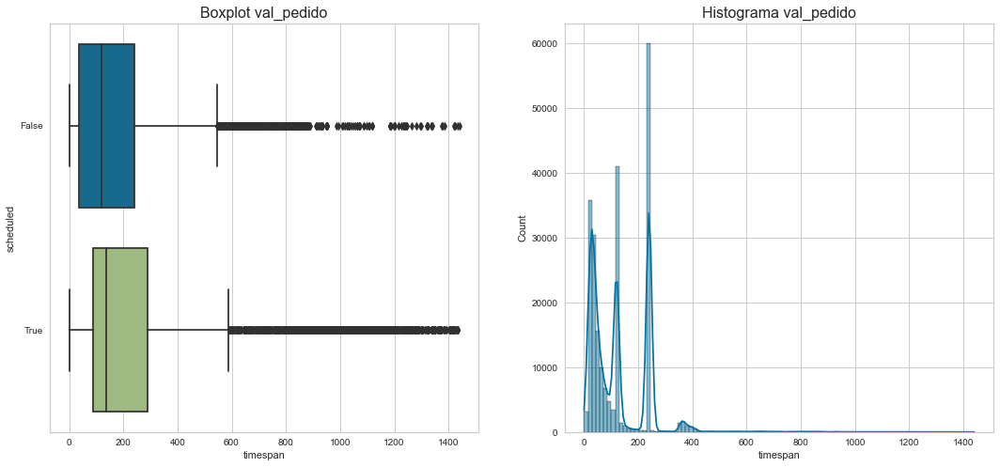

In [343]:
orders.scheduled = orders.scheduled.astype('category')

fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].set_title('Boxplot val_pedido', fontsize = 16)
ax[1].set_title('Histograma val_pedido', fontsize = 16)
sns.boxplot(ax = ax[0], data=orders, x = 'timespan', y = 'scheduled');
sns.histplot(ax = ax[1], data = orders, x = 'timespan', kde = True, bins = 100);

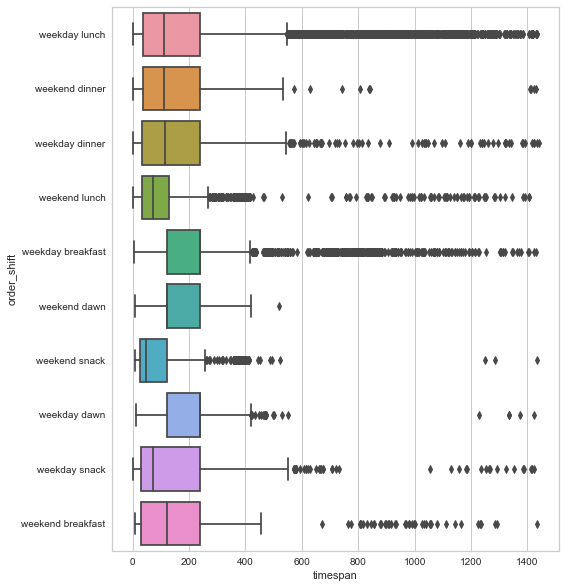

In [344]:
plt.subplots(figsize = (8,10))
sns.boxplot(data = orders, x = 'timespan', y = 'order_shift');

In [345]:
orders.timespan.describe()

count    224799.000000
mean        129.622901
std         119.781916
min           0.200000
25%          35.750000
50%         119.983333
75%         239.983333
max        1439.350000
Name: timespan, dtype: float64

Aparentemetne a hora que o pedido é concluído não é a hora que ele é entregue. Há uma mediana de quase 2 horas (!!!) na entrega dos pedidos, mesmo os que não são agendados (ai faria sentido demorarem mais). Por conta dessa dúvida não vamos entrar a fundo nessa variável de tempo de entrega e não usaremos ela na clusterização.

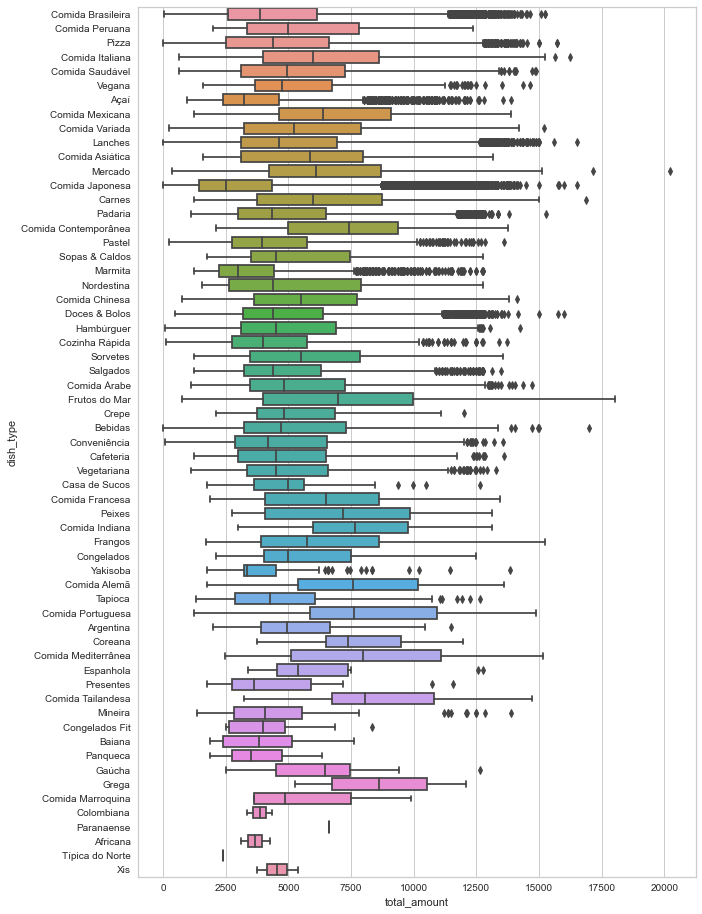

In [346]:
plt.subplots(figsize = (10,16))
sns.boxplot(data = desc, x = 'total_amount', y = 'dish_type');

#### 2.3) Dataset sessions

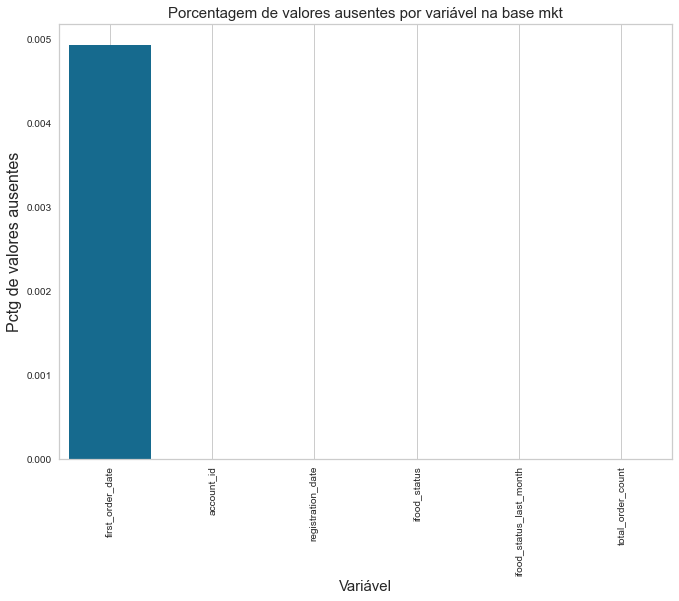

In [347]:
fig, ax = plt.subplots(figsize = (11,8))
ses_nulls =(sessions.isnull().sum()/len(sessions))*100
ses_nulls.sort_values(ascending=False, inplace=True)
sns.barplot(x = mkt_null.index, y =mkt_null.values)
plt.grid()
plt.title('Porcentagem de valores ausentes por variável na base mkt', fontsize = 15)
plt.xlabel(xlabel='Variável', fontsize = 15)
plt.ylabel(ylabel = 'Pctg de valores ausentes', fontsize = 16)
plt.xticks(rotation = '90')
plt.show();

In [348]:
print(f'A qtd média soma de visualizações da tela de restaurante é: {sessions.sum_view_restaurant_screen.mean():.1f} visualizações')
print(f'A mediana de visualizações da tela de restaurante é : {sessions.sum_view_restaurant_screen.median():.1f} visualizações')
print(f'O desvio padrão de visualizações da tela de restaurante é é de : {sessions.sum_view_restaurant_screen.std():.1f} visualizações')

A qtd média soma de visualizações da tela de restaurante é: 6.5 visualizações
A mediana de visualizações da tela de restaurante é : 2.0 visualizações
O desvio padrão de visualizações da tela de restaurante é é de : 12.9 visualizações


In [349]:
print(f'A qtd média soma de visualizações da tela do menu é: {sessions.sum_view_dish_screen.mean():.1f} visualizações')
print(f'A mediana de visualizações da tela do menu é : {sessions.sum_view_dish_screen.median():.1f} visualizações')
print(f'O desvio padrão de visualizações da tela do menu é de : {sessions.sum_view_dish_screen.std():.1f} visualizações')

A qtd média soma de visualizações da tela do menu é: 3.4 visualizações
A mediana de visualizações da tela do menu é : 1.0 visualizações
O desvio padrão de visualizações da tela do menu é de : 6.0 visualizações


In [350]:
print(f'A qtd média soma de cliques pra add item é: {sessions.sum_click_add_item.mean():.1f} cliques')
print(f'A mediana de cliques pra add item é : {sessions.sum_click_add_item.median():.1f} cliques')
print(f'O desvio padrão de cliques pra add item é : {sessions.sum_click_add_item.std():.1f} cliques')

A qtd média soma de cliques pra add item é: 1.6 cliques
A mediana de cliques pra add item é : 1.0 cliques
O desvio padrão de cliques pra add item é : 2.9 cliques


In [351]:
print(f'A qtd média soma de visualizações da tela de checkout é: {sessions.sum_view_checkout.mean():.1f} visualizações')
print(f'A mediana de visualizações da tela de checkout é : {sessions.sum_view_checkout.median():.1f} visualizações')
print(f'O desvio padrão de visualizações da tela de checkout é é de : {sessions.sum_view_checkout.std():.1f} visualizações')

A qtd média soma de visualizações da tela de checkout é: 2.0 visualizações
A mediana de visualizações da tela de checkout é : 1.0 visualizações
O desvio padrão de visualizações da tela de checkout é é de : 4.2 visualizações


In [352]:
print(f'A qtd média soma de cliques pra voltar (antes de fechar a compra): {sessions.sum_callback_purchase.mean():.1f} cliques')
print(f'A mediana  de cliques pra voltar (antes de fechar a compra) : {sessions.sum_callback_purchase.median():.1f} cliques')
print(f'O desvio padrão  de cliques pra voltar (antes de fechar a compra) : {sessions.sum_callback_purchase.std():.1f} cliques')

A qtd média soma de cliques pra voltar (antes de fechar a compra): 0.7 cliques
A mediana  de cliques pra voltar (antes de fechar a compra) : 0.0 cliques
O desvio padrão  de cliques pra voltar (antes de fechar a compra) : 2.1 cliques


In [353]:
print(f'A qtd média de carregamento durante a sessão foi : {sessions.load_time.mean():.1f} segundos')
print(f'A mediana dede carregamento durante a sessão foi : {sessions.load_time.median():.1f} segundos')
print(f'O desvio padrão de carregamento durante a sessão foié : {sessions.load_time.std():.1f} segundos')

A qtd média de carregamento durante a sessão foi : 40.0 segundos
A mediana dede carregamento durante a sessão foi : 4.0 segundos
O desvio padrão de carregamento durante a sessão foié : 1019.4 segundos


In [354]:

print(f'A qtd média de restaurantes disponíveis durante a sesão é de : {sessions.available_restaurants.mean():.1f} restaurantes')
print(f'A mediana de restaurantes disponíveis durante a sesão é de : {sessions.available_restaurants.median():.1f} restaurantes')
print(f'O desvio padrão de restaurantes disponíveis durante a sesão é de : {sessions.available_restaurants.std():.1f} restaurantes')

A qtd média de restaurantes disponíveis durante a sesão é de : 1161.8 restaurantes
A mediana de restaurantes disponíveis durante a sesão é de : 831.0 restaurantes
O desvio padrão de restaurantes disponíveis durante a sesão é de : 1121.2 restaurantes


### 3) Feature Engineering

Precisamos de um df unificado para fazer o nosso cluster, por isso vamos usar os dados dos dfs de sessions e orders para agruparmos por cliente (account_id) e então uni-los ao dataset de mkt, que já tem como chave primária a account_id.

Importante lembrar que na base mkt temos dados dos clientes desde o início do ifood (já sintetizados) e aqui em orders temos dados analíticos de um período de alguns meses. Portanto, o melhor a se fazer é normalizarmos em todas as bases os campos númericos por unidades de tempo (como meses). Assim vamos obter indicadores reais e comparáveis de gastos e frequência de compras do clientes por mês. A unica diferença será que as features oriundas da base de mkt o intervalo de coleta dos dados será maior, equanto as fruto de orders e sessions serão somente com os 8 meses que temos de observação, que em si já constituem um período de tempo bem considerável para uma clusterização confiável (também são os 8 meses mais recentes o que ajuda a nos mostrar uma fotografia atual das segmentações).

Agrupamentos a partir do df orders:

In [355]:
total_amount = orders.groupby('account_id')['total_amount'].sum().to_frame()/8 #total consumido por cliente (sem descontos)
total_subsidy = orders.groupby('account_id')['subsidy_amount'].sum().to_frame()/8 #total de desconto por cliente
total_val_pedido = orders.groupby('account_id')['val_pedido'].sum().to_frame()/8 #total do pedido pago por cliente
qtd = orders.groupby('account_id')['total_amount'].count().to_frame()/8 #quantidade de pedidos para cada cliente durante o nosso intervalo de observações

tm_por_cliente = qtd.join(total_amount, rsuffix = '_valor')
tm_por_cliente['tm'] = tm_por_cliente.total_amount_valor / tm_por_cliente.total_amount
tm_por_cliente = tm_por_cliente.tm.to_frame()


pedidos_por_source = orders.groupby(['account_id','device_platform'])['total_amount'].count().to_frame().unstack()/8 #quantidade de pedidos por plataforma por cliente
pedidos_por_source.columns = pedidos_por_source.columns.droplevel()
pedidos_por_shift = orders.groupby(['account_id','order_shift'])['total_amount'].count().to_frame().unstack()/8 #quantidade de pedidos por turno por cliente
pedidos_por_shift.columns = pedidos_por_shift.columns.droplevel()
pedidos_por_tipo_de_entrega = orders.groupby(['account_id','has_free_delivery'])['total_amount'].count().to_frame().unstack()/8 #quantidade de pedidos com entrega gratis ou naõ
pedidos_por_tipo_de_entrega.columns = pedidos_por_tipo_de_entrega.columns.droplevel()


estado_mais_pedidos = orders.groupby(['account_id','state_label'])['total_amount'].count().to_frame().reset_index().sort_values('total_amount', ascending = False).drop_duplicates(['account_id']).drop(columns = 'total_amount').set_index('account_id') #estado que o cliente fez mais pedidos
source_mais_pedidos = orders.groupby(['account_id','device_platform'])['total_amount'].count().to_frame().reset_index().sort_values('total_amount', ascending = False).drop_duplicates(['account_id']).drop(columns = 'total_amount').set_index('account_id') 
shift_mais_pedidos = orders.groupby(['account_id','order_shift'])['total_amount'].count().to_frame().reset_index().sort_values('total_amount', ascending = False).drop_duplicates(['account_id']).drop(columns = 'total_amount').set_index('account_id') 


In [356]:
features = [total_amount,total_subsidy,total_val_pedido,qtd,tm_por_cliente,pedidos_por_source,pedidos_por_shift,
            pedidos_por_tipo_de_entrega,estado_mais_pedidos,source_mais_pedidos,shift_mais_pedidos]

In [357]:
for feature in features:
    mkt = mkt.join(feature, on = 'account_id',rsuffix= '_')

In [358]:
mkt.rename(columns = {'total_amount':'total_pedidos',
'subsidy_amount':'total_descontos',
'val_pedido':'total_pago',
'total_amount_':'pedidos_por_mes',
'tm':'ticket_medio',
'ANDROID':'pedidos_por_mes_android',
'DESKTOP':'pedidos_por_mes_desktop',
'IOS':'pedidos_por_mes_ios',
'weekday breakfast':'pedidos_por_mes_cafe_util',
'weekday dawn':'pedidos_por_mes_madrugada_util',
'weekday dinner':'pedidos_por_mes_jantar_util',
'weekday lunch':'pedidos_por_mes_almoco_util',
'weekday snack':'pedidos_por_mes_lanche_util',
'weekend breakfast':'pedidos_por_mes_cafe_fds',
'weekend dawn':'pedidos_por_mes_madrugada_fds',
'weekend dinner':'pedidos_por_mes_jantar_fds',
'weekend lunch':'pedidos_por_mes_almoco_fds',
'weekend snack':'pedidos_por_mes_lanche_fds',
False:'pedidos_entrega_paga_mes',
True:'pedidos_entrega_gratis_mes',
'state_label':'estado_mais_pedidos',
'device_platform':'device_mais_pedidos',
'order_shift':'shift_mais_pedidos'
}, inplace = True)

In [359]:
views_restaurante_mes = sessions.groupby(['user_account_uuid'])['sum_view_restaurant_screen'].sum().to_frame()/8
views_prato = sessions.groupby(['user_account_uuid'])['sum_view_dish_screen'].sum().to_frame()/8
add_item_mes = sessions.groupby(['user_account_uuid'])['sum_click_add_item'].sum().to_frame()/8
checkouts_mes = sessions.groupby(['user_account_uuid'])['sum_view_checkout'].sum().to_frame()/8
desistencias_mes = sessions.groupby(['user_account_uuid'])['sum_callback_purchase'].sum().to_frame()/8

In [360]:
features = [views_restaurante_mes,views_prato, add_item_mes, checkouts_mes, desistencias_mes]

for feature in features:
    mkt = mkt.join(feature, on = 'account_id',rsuffix= '_')

In [361]:
mkt.rename(columns = {'sum_view_restaurant_screen':'views_restaurante_mes',
'sum_view_dish_screen':'views_pratos_mes',
'sum_click_add_item':'add_itens_mes',
'sum_view_checkout':'checkouts_mes',
'sum_callback_purchase':'callbacks_mes',
}, inplace = True)

In [362]:
mkt['pedidos_por_mes_desde_cadastro'] = mkt.total_order_count / (mkt.tempo_cadastro / 30.5)
mkt['pedidos_por_mes_desde_primeiro_pedido'] = mkt.total_order_count / (mkt.tempo_primeiro_pedido / 30.5)

In [363]:
df = mkt

Preenchendo os valores missing com 0

In [364]:
df.fillna(0, inplace = True)

Agora vamos remover do nosso df que será na clusterização os dados dos pouco mais de 6000 clientes que tinham cadastro mas não fizeram nenhum pedido durante os 8 meses de duração da nossa base orders.

In [365]:
df = df.loc[df['total_pedidos'] > 0]

In [366]:
df.shape

(13939, 39)

Com isso, após a nossa feature engineering ficamos com aproximadamente 14 mil usuários e 39 features para verificarmos quais são as possíveis clusterizações da nossa base de cliente.

### 4) EDA no df unificado

Vamos aplicar a normalização as features numéricas dos nossos dados de forma a reduzir o ruído e permitir uma melhor clusterização.

In [367]:
from sklearn.preprocessing import StandardScaler, RobustScaler

In [368]:
cols = df.select_dtypes([np.int64,np.float64]).columns

In [369]:
scaler = RobustScaler()

In [370]:
df[cols] = scaler.fit_transform(df[cols])

Definindo a função do scatter em que plotaremos as nossas possíveis clusterizações.

In [371]:
def scatter(df,x,y,z):
    fig = px.scatter_3d(df, x=x, y=y, z=z, height = 800, width = 1000)
    fig.show()

Agora vamos plotar esses scatters e verificar as relações entre as features que podem gerar boas clusterizações para os nossos dados.

In [372]:
scatter(df,'pedidos_por_mes','total_descontos','total_pago')

In [373]:
scatter(df,'total_pedidos','pedidos_entrega_gratis_mes','pedidos_por_mes')

In [374]:
scatter(df,'pedidos_por_mes','add_itens_mes','views_restaurante_mes')

In [375]:
scatter(df,'ticket_medio','pedidos_por_mes_jantar_fds','pedidos_por_mes')

In [376]:
scatter(df,'ticket_medio','pedidos_por_mes_almoco_util','pedidos_por_mes')

### 5) Clusterização

#### 5.1) Pedidos por Mes vs Total Pago vs Total Descontos

In [439]:
df_cluster = df[['pedidos_por_mes','total_pago','total_descontos']]

In [440]:
cluster = np.array(df_cluster)

In [379]:
def cotovelo(cluster):
    model = KMeans(random_state=123, init = 'k-means++', n_init = 10, max_iter=100) 

    visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette', timings=False)

    visualizer.fit(cluster)    
    visualizer.poof()

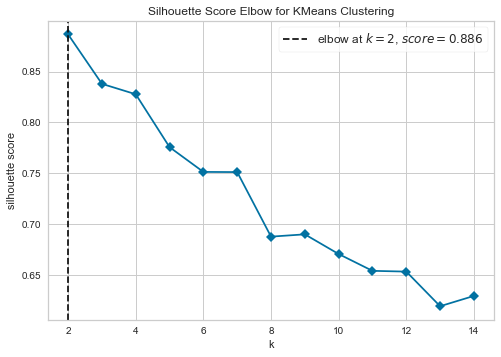

In [380]:
cotovelo(cluster)

In [441]:
km = KMeans(random_state = 42, n_init = 10, max_iter=100,n_clusters=7)

In [442]:
km.fit(cluster)

KMeans(max_iter=100, n_clusters=7, random_state=42)

In [443]:
df_cluster['label'] = km.labels_

In [384]:
def scatter_clusterizado(df,x,y,z):
    fig = px.scatter_3d(df, x=x, y=y, z=z, color = df['label'], height = 800, width = 1000)
    fig.show()

In [444]:
scatter_clusterizado(df_cluster,'pedidos_por_mes','total_descontos','total_pago')

Quando utilizamos 7 clusters foi possível ver quais clientes fazem vários pedidos por mês e não utilizam os descontos (bolas vermelhas). Para esses clientes poderiamos desenvolver estratégias de marketing diferente ressaltando como fazer o uso dos cupons de desconto, já que eles tendem a fazer pedidos com frequência sem os descontos e com descontos poderiam gastar mais e com mais frequência ainda. Provavelmente não saber o utilizar o cupom seja uma das maiores causas desses clientes não utilizarem descontos, já que na clusterização é claro como essees clientes fazem pedidos com frequência.

Temos também em roxo e amarelo clientes que utilizaram valores altos de desconto (roxo o mais alto de todos, seguido pelo amarelo). Porém em ambos clusters eles não fizeram pedidos com frequência. Para esses dois clusters portanto, poderiamos elaborar uma estratégia de desconto progressivo de forma a incentivar o aumento da frequência fazendo uso de algo que estes clientes já gostem (desconto).

O cluster das bolas laranjas escuras abriga os clientes que gastam bastante, mas não pegam tantos descontos e não pedem com tanta frequência. Incentiva-los a usar os descontos inclusive poderia aumentar o número de pedidos por mês desses clientes. Portanto, seria interessante uma estratégia com foco em descontos (já que esses clientes são acostumados a gastar muito, com preço cheio) de forma a passar para o cliente uma percepção que está fazendo um bom negócio, o que poderia inclusive também aumentar a frequência de compras dos clientes desse cluster, que não é alta.


#### 5.2) Total Pedidos vs Pedidos Entrega Gratis por Mes vs Pedidos por Mes

In [416]:
df_cluster = df[['total_pedidos','pedidos_entrega_gratis_mes','pedidos_por_mes']]
cluster = np.array(df_cluster)

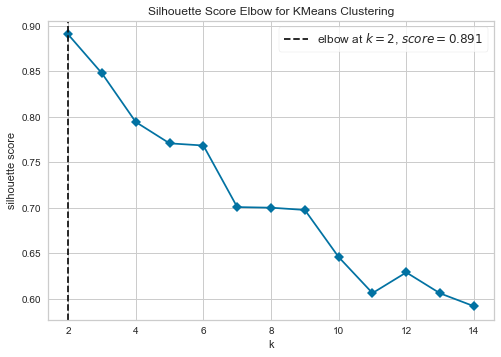

In [404]:
cotovelo(cluster)

In [417]:
km = KMeans(random_state = 42, n_init = 10, max_iter=100,n_clusters=7)
km.fit(cluster)
df_cluster['label'] = km.labels_

In [418]:
scatter_clusterizado(df_cluster,'total_pedidos','pedidos_entrega_gratis_mes','pedidos_por_mes')

#### 5.3) Pedidos por mes vs Add itens Mes vs Views Restaurante Mes

In [420]:
df_cluster = df[['add_itens_mes','views_restaurante_mes','pedidos_por_mes']]
cluster = np.array(df_cluster)

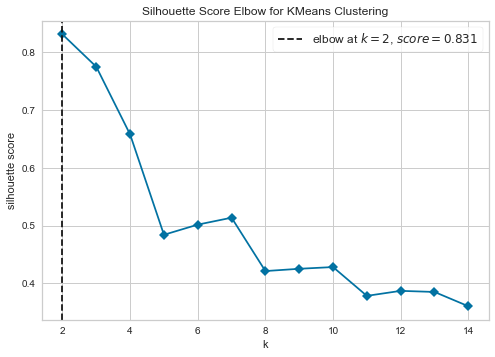

In [410]:
cotovelo(cluster)

In [422]:
km = KMeans(random_state = 42, n_init = 10, max_iter=100,n_clusters=8)
km.fit(cluster)
df_cluster['label'] = km.labels_

In [423]:
scatter_clusterizado(df_cluster,'add_itens_mes','views_restaurante_mes','pedidos_por_mes')

#### 5.4) Ticket medio vs Pedidos por Mes (Jantar fim de semana) vs Pedidos por Mes

In [424]:
df_cluster = df[['ticket_medio','pedidos_por_mes_jantar_fds','pedidos_por_mes']]
cluster = np.array(df_cluster)

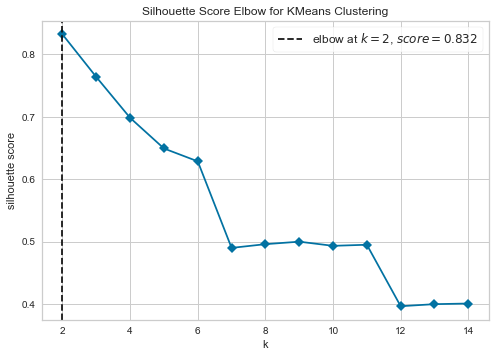

In [395]:
cotovelo(cluster)

In [425]:
km = KMeans(random_state = 42, n_init = 10, max_iter=100,n_clusters=7)
km.fit(cluster)
df_cluster['label'] = km.labels_

In [426]:
scatter_clusterizado(df_cluster,'ticket_medio','pedidos_por_mes_jantar_fds','pedidos_por_mes')

#### 5.5) Ticket medio vs Pedidos por Mes (Almoço dia de semana) vs Pedidos por Mes

In [427]:
df_cluster = df[['ticket_medio','pedidos_por_mes_almoco_util','pedidos_por_mes']]
cluster = np.array(df_cluster)

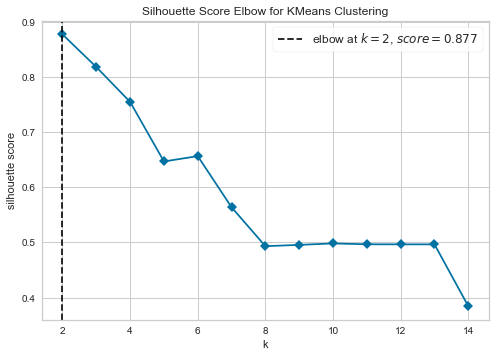

In [399]:
cotovelo(cluster)

In [428]:
km = KMeans(random_state = 42, n_init = 10, max_iter=100,n_clusters=5)
km.fit(cluster)
df_cluster['label'] = km.labels_

In [429]:
scatter_clusterizado(df_cluster,'ticket_medio','pedidos_por_mes_almoco_util','pedidos_por_mes')